In [3]:
import os
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, f1_score, jaccard_score
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
import cv2


In [4]:
def dice_coefficient(y_true, y_pred, smooth=1):
    y_true_f = tf.keras.backend.flatten(y_true)
    y_pred_f = tf.keras.backend.flatten(y_pred)
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + smooth)

def dice_loss(y_true, y_pred):
    return 1 - dice_coefficient(y_true, y_pred)


In [6]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [9]:
train_img_dir  = "/content/drive/MyDrive/Road_dataset/tiff/train"
train_mask_dir = "/content/drive/MyDrive/Road_dataset/tiff/train_labels"

🔹 Cell 3: Load Dataset (PNG)

In [10]:
# 🟩 Code Cell: Load & Preprocess PNG Images and Masks
def load_data(image_dir, mask_dir, img_size=(128, 128)):
    images, masks = [], []
    missing_masks = []
    broken_images = []
    broken_masks = []

    for filename in sorted(os.listdir(image_dir)):
        if not filename.lower().endswith(".png"):
            continue

        img_path  = os.path.join(image_dir, filename)
        mask_path = os.path.join(mask_dir,  filename)

        if not os.path.exists(mask_path):
            missing_masks.append(filename)
            continue

        # read files
        img  = cv2.imread(img_path,  cv2.IMREAD_COLOR)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

        if img is None:
            broken_images.append(filename)
            continue
        if mask is None:
            broken_masks.append(filename)
            continue

        # resize
        img  = cv2.resize(img,  img_size)
        mask = cv2.resize(mask, img_size)

        # normalize image to [0,1]
        img = img.astype(np.float32) / 255.0

        # binarize mask to 0 or 1
        _, mask_bin = cv2.threshold(mask, 127, 1, cv2.THRESH_BINARY)
        mask_bin = mask_bin.astype(np.float32)[..., np.newaxis]

        images.append(img)
        masks.append(mask_bin)

    # summary of what was loaded / skipped
    print(f"[INFO] Loaded {len(images)} image–mask pairs")
    if missing_masks:
        print(f"[WARN] Missing masks for {len(missing_masks)} images: {missing_masks[:5]}{'...' if len(missing_masks)>5 else ''}")
    if broken_images:
        print(f"[WARN] Failed to load {len(broken_images)} image files: {broken_images[:5]}{'...' if len(broken_images)>5 else ''}")
    if broken_masks:
        print(f"[WARN] Failed to load {len(broken_masks)} mask files: {broken_masks[:5]}{'...' if len(broken_masks)>5 else ''}")

    return np.array(images), np.array(masks)

# Usage:
train_img_dir  = "/content/drive/MyDrive/Road_dataset/tiff/train"
train_mask_dir = "/content/drive/MyDrive/Road_dataset/tiff/train_labels"
X, y = load_data(train_img_dir, train_mask_dir, img_size=(256, 256))


[INFO] Loaded 1108 image–mask pairs


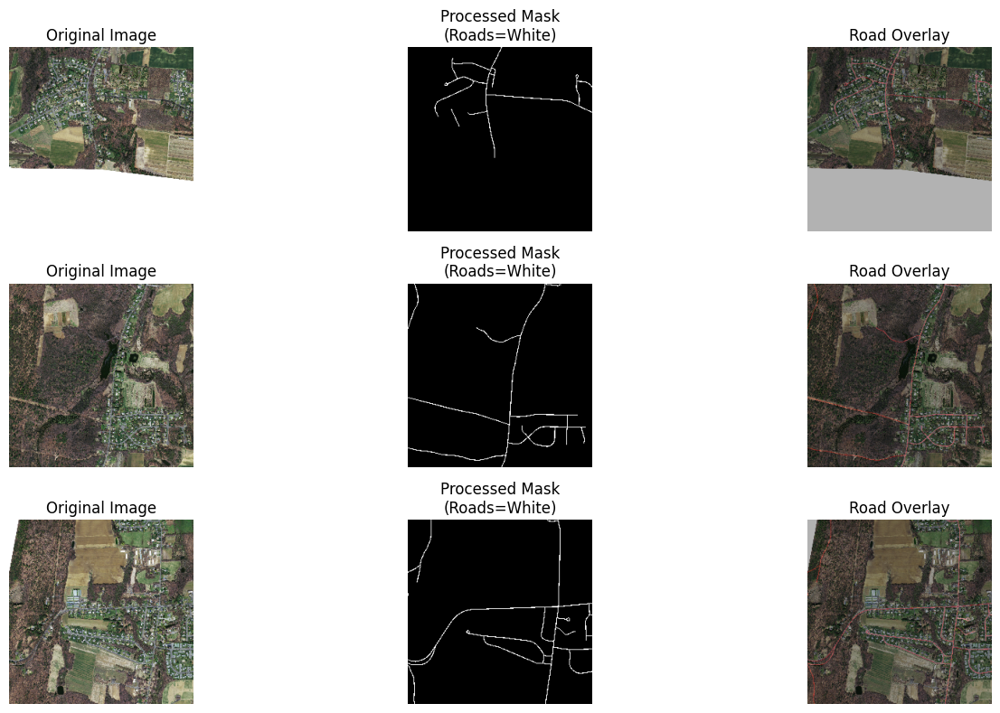

In [11]:
# 🔹 Cell 4: Visualize Sample Inputs, Masks, and Road Overlay

import matplotlib.pyplot as plt
import cv2

# Show three random samples (or change indices as you like)
idxs = [0, 1, 2]

plt.figure(figsize=(15, 8))
for i, idx in enumerate(idxs):
    img  = (X[idx] * 255).astype('uint8')           # back to 0–255
    mask = (y[idx].squeeze() * 255).astype('uint8')  # single‐channel mask

    # Convert BGR→RGB for display
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Create a red overlay where mask == 255
    red_mask = np.zeros_like(img)
    red_mask[..., 2] = mask                          # put mask into R channel
    overlay = cv2.addWeighted(img, 0.7, red_mask, 0.3, 0)
    overlay_rgb = cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)

    # Plot Original
    plt.subplot(3, 3, i*3 + 1)
    plt.imshow(img_rgb)
    plt.title("Original Image")
    plt.axis('off')

    # Plot Mask
    plt.subplot(3, 3, i*3 + 2)
    plt.imshow(mask, cmap='gray')
    plt.title("Processed Mask\n(Roads=White)")
    plt.axis('off')

    # Plot Overlay
    plt.subplot(3, 3, i*3 + 3)
    plt.imshow(overlay_rgb)
    plt.title("Road Overlay")
    plt.axis('off')

plt.tight_layout()
plt.show()


In [12]:
# 🔹 Cell 5: Custom Metrics, Loss & U‑Net Model Definition

import tensorflow as tf
from tensorflow.keras import backend as K
from tensorflow.keras.layers import (Input, Conv2D, BatchNormalization, Activation,
                                     MaxPooling2D, Dropout, UpSampling2D, concatenate)
from tensorflow.keras.models import Model
from tensorflow.keras.losses import BinaryCrossentropy

# Losses
bce = tf.keras.losses.BinaryCrossentropy()

def dice_coef(y_true, y_pred, smooth=1e-6):
    y_true_f = tf.keras.backend.flatten(y_true)
    y_pred_f = tf.keras.backend.flatten(y_pred)
    inter = tf.reduce_sum(y_true_f * y_pred_f)
    return (2. * inter + smooth) / (tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + smooth)

def iou_coef(y_true, y_pred, smooth=1e-6):
    y_true_f = tf.keras.backend.flatten(y_true)
    y_pred_f = tf.keras.backend.flatten(y_pred)
    inter = tf.reduce_sum(y_true_f * y_pred_f)
    union = tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) - inter
    return (inter + smooth) / (union + smooth)

def bce_dice_loss(y_true, y_pred):
    return bce(y_true, y_pred) + (1 - dice_coef(y_true, y_pred))
from tensorflow.keras.layers import Add, Multiply


def build_attention_unet(input_shape=(256, 256, 3), dropout=0.1):
    def conv_block(x, filters):
        x = Conv2D(filters, 3, padding='same')(x)
        x = BatchNormalization()(x)
        x = Activation('relu')(x)
        x = Conv2D(filters, 3, padding='same')(x)
        x = BatchNormalization()(x)
        x = Activation('relu')(x)
        return x

    def encoder_block(x, filters):
        c = conv_block(x, filters)
        p = MaxPooling2D()(c)
        p = Dropout(dropout)(p)
        return c, p

    def attention_gate(x, g, inter_shape):
        theta_x = Conv2D(inter_shape, 1, padding='same')(x)
        phi_g = Conv2D(inter_shape, 1, padding='same')(g)
        add = Activation('relu')(Add()([theta_x, phi_g]))
        psi = Conv2D(1, 1, padding='same')(add)
        psi = Activation('sigmoid')(psi)
        return Multiply()([x, psi])

    def decoder_block(x, skip, filters):
        u = UpSampling2D()(x)
        u = Conv2D(filters, 2, padding='same')(u)
        u = Activation('relu')(u)

        # 👇 Apply attention before merging skip connection
        attn = attention_gate(skip, u, filters)
        m = concatenate([u, attn])
        c = conv_block(m, filters)
        c = Dropout(dropout)(c)
        return c

    # Input
    inputs = Input(input_shape)

    # Encoder
    s1, p1 = encoder_block(inputs,  64)
    s2, p2 = encoder_block(p1,     128)
    s3, p3 = encoder_block(p2,     256)
    s4, p4 = encoder_block(p3,     512)

    # Bridge
    b5 = conv_block(p4, 1024)

    # Decoder (with attention)
    d6 = decoder_block(b5, s4, 512)
    d7 = decoder_block(d6, s3, 256)
    d8 = decoder_block(d7, s2, 128)
    d9 = decoder_block(d8, s1, 64)

    # Output layer
    outputs = Conv2D(1, 1, activation='sigmoid')(d9)

    return Model(inputs, outputs)
model = build_attention_unet((256, 256, 3))
model.summary()



Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_48 (Conv2D)  │ (None, 256, 256,  │      1,792 │ input_layer_2[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        256 │ conv2d_48[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_42       │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_49 (Conv2D)  │ (None, 256, 256,  │     36,928 │ activation_42[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        256 │ conv2d_49[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_43       │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_8     │ (None, 128, 128,  │          0 │ activation_43[0]… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_12          │ (None, 128, 128,  │          0 │ max_pooling2d_8[… │
│ (Dropout)           │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_50 (Conv2D)  │ (None, 128, 128,  │     73,856 │ dropout_12[0][0]  │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        512 │ conv2d_50[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_44       │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_51 (Conv2D)  │ (None, 128, 128,  │    147,584 │ activation_44[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        512 │ conv2d_51[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_45       │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_9     │ (None, 64, 64,    │          0 │ activation_45[0]… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_13          │ (None, 64, 64,    │          0 │ max_pooling2d_9[

 Total params: 31,754,501 (121.13 MB)

 Trainable params: 31,742,725 (121.09 MB)

 Non-trainable params: 11,776 (46.00 KB)

In [13]:
# 🔹 Cell 6: Load & Split Data

from sklearn.model_selection import train_test_split

# X, y have been loaded and preprocessed in Cell 3
# Split into 70% train / 15% val / 15% test

X_train, X_temp, y_train, y_temp = train_test_split(
    X, y,
    test_size=0.30,
    random_state=42,
    shuffle=True
)

X_val, X_test, y_val, y_test = train_test_split(
    X_temp, y_temp,
    test_size=0.50,
    random_state=42,
    shuffle=True
)

print(f"Training set:   {X_train.shape} inputs, {y_train.shape} masks")
print(f"Validation set: {X_val.shape} inputs, {y_val.shape} masks")
print(f"Test set:       {X_test.shape} inputs, {y_test.shape} masks")


Training set:   (775, 256, 256, 3) inputs, (775, 256, 256, 1) masks
Validation set: (166, 256, 256, 3) inputs, (166, 256, 256, 1) masks
Test set:       (167, 256, 256, 3) inputs, (167, 256, 256, 1) masks


In [14]:
# 🟩 Cell 7: Optimized Training with Early Stopping, LR Scheduler, and Checkpoint

from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
import matplotlib.pyplot as plt


# Compile the model
model.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss=bce_dice_loss,
    metrics=[dice_coef, iou_coef, 'accuracy']
)

# Callbacks
checkpoint_cb = ModelCheckpoint("best_unet_model.h5",
                                save_best_only=True,
                                monitor="val_loss",
                                mode="min",
                                verbose=1)

earlystop_cb = EarlyStopping(
    monitor="val_loss",
    min_delta=1e-4,       # minimum change to qualify as an improvement
    patience=10,          # stop after 10 epochs of no improvement
    verbose=1,
    restore_best_weights=True
)

reduce_lr_cb = ReduceLROnPlateau(
    monitor="val_loss",
    factor=0.5,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

history = model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=100,
    batch_size=16,
    callbacks=[checkpoint_cb, earlystop_cb, reduce_lr_cb],
    verbose=1
)



Epoch 1/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 707ms/step - accuracy: 0.7502 - dice_coef: 0.0987 - iou_coef: 0.0520 - loss: 1.4301
Epoch 1: val_loss improved from inf to 1.43692, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 101s 880ms/step - accuracy: 0.7520 - dice_coef: 0.0989 - iou_coef: 0.0521 - loss: 1.4279 - val_accuracy: 0.8895 - val_dice_coef: 0.0815 - val_iou_coef: 0.0425 - val_loss: 1.4369 - learning_rate: 1.0000e-04
Epoch 2/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - accuracy: 0.9385 - dice_coef: 0.1324 - iou_coef: 0.0710 - loss: 1.1132
Epoch 2: val_loss did not improve from 1.43692
49/49 ━━━━━━━━━━━━━━━━━━━━ 7s 136ms/step - accuracy: 0.9385 - dice_coef: 0.1327 - iou_coef: 0.0712 - loss: 1.1128 - val_accuracy: 0.1350 - val_dice_coef: 0.0867 - val_iou_coef: 0.0454 - val_loss: 7.9309 - learning_rate: 1.0000e-04
Epoch 3/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - accuracy: 0.9323 - dice_coef: 0.1758 - iou_coef: 0.0965 - loss: 1.0418
Epoch 3: val_loss improved from 1.43692 to 1.15641, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - accuracy: 0.9324 - dice_coef: 0.1760 - iou_coef: 0.0966 - loss: 1.0415 - val_accuracy: 0.9534 - val_dice_coef: 0.0692 - val_iou_coef: 0.0359 - val_loss: 1.1564 - learning_rate: 1.0000e-04
Epoch 4/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - accuracy: 0.9362 - dice_coef: 0.2111 - iou_coef: 0.1181 - loss: 0.9864
Epoch 4: val_loss improved from 1.15641 to 1.13266, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - accuracy: 0.9362 - dice_coef: 0.2112 - iou_coef: 0.1182 - loss: 0.9863 - val_accuracy: 0.9534 - val_dice_coef: 0.0653 - val_iou_coef: 0.0338 - val_loss: 1.1327 - learning_rate: 1.0000e-04
Epoch 5/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - accuracy: 0.9382 - dice_coef: 0.2368 - iou_coef: 0.1346 - loss: 0.9517
Epoch 5: val_loss did not improve from 1.13266
49/49 ━━━━━━━━━━━━━━━━━━━━ 7s 136ms/step - accuracy: 0.9382 - dice_coef: 0.2370 - iou_coef: 0.1347 - loss: 0.9514 - val_accuracy: 0.7730 - val_dice_coef: 0.0836 - val_iou_coef: 0.0438 - val_loss: 1.5712 - learning_rate: 1.0000e-04
Epoch 6/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - accuracy: 0.9400 - dice_coef: 0.2758 - iou_coef: 0.1601 - loss: 0.9051
Epoch 6: val_loss did not improve from 1.13266
49/49 ━━━━━━━━━━━━━━━━━━━━ 7s 136ms/step - accuracy: 0.9401 - dice_coef: 0.2758 - iou_coef: 0.1601 - loss: 0.9050 - val_accuracy: 0.9534 - val_dice_coef: 0.0492 - val_iou_coef: 0.0252 - val_lo

49/49 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - accuracy: 0.9494 - dice_coef: 0.3504 - iou_coef: 0.2127 - loss: 0.8073 - val_accuracy: 0.9540 - val_dice_coef: 0.0870 - val_iou_coef: 0.0455 - val_loss: 1.0968 - learning_rate: 1.0000e-04
Epoch 10/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - accuracy: 0.9516 - dice_coef: 0.3646 - iou_coef: 0.2233 - loss: 0.7878
Epoch 10: val_loss improved from 1.09683 to 1.07172, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - accuracy: 0.9516 - dice_coef: 0.3646 - iou_coef: 0.2233 - loss: 0.7878 - val_accuracy: 0.9552 - val_dice_coef: 0.1500 - val_iou_coef: 0.0813 - val_loss: 1.0717 - learning_rate: 1.0000e-04
Epoch 11/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - accuracy: 0.9522 - dice_coef: 0.3768 - iou_coef: 0.2324 - loss: 0.7744
Epoch 11: val_loss improved from 1.07172 to 0.95087, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 8s 161ms/step - accuracy: 0.9522 - dice_coef: 0.3769 - iou_coef: 0.2325 - loss: 0.7741 - val_accuracy: 0.9560 - val_dice_coef: 0.2157 - val_iou_coef: 0.1212 - val_loss: 0.9509 - learning_rate: 1.0000e-04
Epoch 12/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - accuracy: 0.9568 - dice_coef: 0.4075 - iou_coef: 0.2561 - loss: 0.7322
Epoch 12: val_loss improved from 0.95087 to 0.87779, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 8s 161ms/step - accuracy: 0.9568 - dice_coef: 0.4075 - iou_coef: 0.2561 - loss: 0.7323 - val_accuracy: 0.9559 - val_dice_coef: 0.2955 - val_iou_coef: 0.1739 - val_loss: 0.8778 - learning_rate: 1.0000e-04
Epoch 13/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - accuracy: 0.9571 - dice_coef: 0.4191 - iou_coef: 0.2656 - loss: 0.7200
Epoch 13: val_loss did not improve from 0.87779
49/49 ━━━━━━━━━━━━━━━━━━━━ 7s 136ms/step - accuracy: 0.9571 - dice_coef: 0.4192 - iou_coef: 0.2656 - loss: 0.7199 - val_accuracy: 0.9593 - val_dice_coef: 0.3257 - val_iou_coef: 0.1950 - val_loss: 0.9178 - learning_rate: 1.0000e-04
Epoch 14/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - accuracy: 0.9583 - dice_coef: 0.4416 - iou_coef: 0.2840 - loss: 0.6950
Epoch 14: val_loss improved from 0.87779 to 0.75727, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 8s 161ms/step - accuracy: 0.9583 - dice_coef: 0.4414 - iou_coef: 0.2839 - loss: 0.6952 - val_accuracy: 0.9601 - val_dice_coef: 0.3799 - val_iou_coef: 0.2350 - val_loss: 0.7573 - learning_rate: 1.0000e-04
Epoch 15/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - accuracy: 0.9592 - dice_coef: 0.4454 - iou_coef: 0.2872 - loss: 0.6881
Epoch 15: val_loss did not improve from 0.75727
49/49 ━━━━━━━━━━━━━━━━━━━━ 7s 136ms/step - accuracy: 0.9592 - dice_coef: 0.4455 - iou_coef: 0.2873 - loss: 0.6881 - val_accuracy: 0.9573 - val_dice_coef: 0.4452 - val_iou_coef: 0.2867 - val_loss: 1.2229 - learning_rate: 1.0000e-04
Epoch 16/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - accuracy: 0.9621 - dice_coef: 0.4634 - iou_coef: 0.3022 - loss: 0.6629
Epoch 16: val_loss improved from 0.75727 to 0.67078, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - accuracy: 0.9621 - dice_coef: 0.4635 - iou_coef: 0.3022 - loss: 0.6630 - val_accuracy: 0.9616 - val_dice_coef: 0.4564 - val_iou_coef: 0.2963 - val_loss: 0.6708 - learning_rate: 1.0000e-04
Epoch 17/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - accuracy: 0.9616 - dice_coef: 0.4736 - iou_coef: 0.3110 - loss: 0.6539
Epoch 17: val_loss did not improve from 0.67078
49/49 ━━━━━━━━━━━━━━━━━━━━ 7s 136ms/step - accuracy: 0.9615 - dice_coef: 0.4736 - iou_coef: 0.3110 - loss: 0.6540 - val_accuracy: 0.9593 - val_dice_coef: 0.4781 - val_iou_coef: 0.3146 - val_loss: 0.9426 - learning_rate: 1.0000e-04
Epoch 18/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - accuracy: 0.9615 - dice_coef: 0.4856 - iou_coef: 0.3213 - loss: 0.6434
Epoch 18: val_loss improved from 0.67078 to 0.64060, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - accuracy: 0.9615 - dice_coef: 0.4856 - iou_coef: 0.3213 - loss: 0.6434 - val_accuracy: 0.9611 - val_dice_coef: 0.4889 - val_iou_coef: 0.3241 - val_loss: 0.6406 - learning_rate: 1.0000e-04
Epoch 19/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - accuracy: 0.9601 - dice_coef: 0.4933 - iou_coef: 0.3280 - loss: 0.6408
Epoch 19: val_loss did not improve from 0.64060
49/49 ━━━━━━━━━━━━━━━━━━━━ 7s 137ms/step - accuracy: 0.9602 - dice_coef: 0.4934 - iou_coef: 0.3281 - loss: 0.6406 - val_accuracy: 0.9577 - val_dice_coef: 0.4959 - val_iou_coef: 0.3302 - val_loss: 0.6691 - learning_rate: 1.0000e-04
Epoch 20/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - accuracy: 0.9634 - dice_coef: 0.5100 - iou_coef: 0.3432 - loss: 0.6153
Epoch 20: val_loss improved from 0.64060 to 0.63595, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - accuracy: 0.9634 - dice_coef: 0.5100 - iou_coef: 0.3432 - loss: 0.6154 - val_accuracy: 0.9630 - val_dice_coef: 0.5003 - val_iou_coef: 0.3343 - val_loss: 0.6359 - learning_rate: 1.0000e-04
Epoch 21/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - accuracy: 0.9634 - dice_coef: 0.5145 - iou_coef: 0.3469 - loss: 0.6103
Epoch 21: val_loss did not improve from 0.63595
49/49 ━━━━━━━━━━━━━━━━━━━━ 7s 136ms/step - accuracy: 0.9634 - dice_coef: 0.5145 - iou_coef: 0.3470 - loss: 0.6103 - val_accuracy: 0.9643 - val_dice_coef: 0.5128 - val_iou_coef: 0.3455 - val_loss: 0.8330 - learning_rate: 1.0000e-04
Epoch 22/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - accuracy: 0.9638 - dice_coef: 0.5246 - iou_coef: 0.3559 - loss: 0.6004
Epoch 22: val_loss did not improve from 0.63595
49/49 ━━━━━━━━━━━━━━━━━━━━ 7s 136ms/step - accuracy: 0.9638 - dice_coef: 0.5246 - iou_coef: 0.3559 - loss: 0.6005 - val_accuracy: 0.9645 - val_dice_coef: 0.5142 - val_iou_coef: 0.3470 - va

49/49 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - accuracy: 0.9630 - dice_coef: 0.5332 - iou_coef: 0.3643 - loss: 0.5931 - val_accuracy: 0.9610 - val_dice_coef: 0.5354 - val_iou_coef: 0.3661 - val_loss: 0.5923 - learning_rate: 1.0000e-04
Epoch 24/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - accuracy: 0.9646 - dice_coef: 0.5300 - iou_coef: 0.3614 - loss: 0.5950
Epoch 24: val_loss improved from 0.59229 to 0.58735, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - accuracy: 0.9646 - dice_coef: 0.5302 - iou_coef: 0.3616 - loss: 0.5948 - val_accuracy: 0.9606 - val_dice_coef: 0.5407 - val_iou_coef: 0.3711 - val_loss: 0.5873 - learning_rate: 1.0000e-04
Epoch 25/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - accuracy: 0.9645 - dice_coef: 0.5450 - iou_coef: 0.3757 - loss: 0.5795
Epoch 25: val_loss improved from 0.58735 to 0.58082, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - accuracy: 0.9645 - dice_coef: 0.5451 - iou_coef: 0.3757 - loss: 0.5794 - val_accuracy: 0.9608 - val_dice_coef: 0.5477 - val_iou_coef: 0.3777 - val_loss: 0.5808 - learning_rate: 1.0000e-04
Epoch 26/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - accuracy: 0.9644 - dice_coef: 0.5566 - iou_coef: 0.3862 - loss: 0.5683
Epoch 26: val_loss improved from 0.58082 to 0.55746, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 8s 161ms/step - accuracy: 0.9644 - dice_coef: 0.5566 - iou_coef: 0.3862 - loss: 0.5683 - val_accuracy: 0.9653 - val_dice_coef: 0.5600 - val_iou_coef: 0.3895 - val_loss: 0.5575 - learning_rate: 1.0000e-04
Epoch 27/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - accuracy: 0.9662 - dice_coef: 0.5581 - iou_coef: 0.3878 - loss: 0.5624
Epoch 27: val_loss did not improve from 0.55746
49/49 ━━━━━━━━━━━━━━━━━━━━ 7s 136ms/step - accuracy: 0.9662 - dice_coef: 0.5581 - iou_coef: 0.3877 - loss: 0.5625 - val_accuracy: 0.9633 - val_dice_coef: 0.5564 - val_iou_coef: 0.3860 - val_loss: 0.5649 - learning_rate: 1.0000e-04
Epoch 28/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - accuracy: 0.9636 - dice_coef: 0.5587 - iou_coef: 0.3887 - loss: 0.5696
Epoch 28: val_loss improved from 0.55746 to 0.55669, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - accuracy: 0.9636 - dice_coef: 0.5588 - iou_coef: 0.3888 - loss: 0.5694 - val_accuracy: 0.9649 - val_dice_coef: 0.5630 - val_iou_coef: 0.3924 - val_loss: 0.5567 - learning_rate: 1.0000e-04
Epoch 29/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - accuracy: 0.9651 - dice_coef: 0.5629 - iou_coef: 0.3931 - loss: 0.5622
Epoch 29: val_loss improved from 0.55669 to 0.54195, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - accuracy: 0.9652 - dice_coef: 0.5630 - iou_coef: 0.3932 - loss: 0.5621 - val_accuracy: 0.9663 - val_dice_coef: 0.5756 - val_iou_coef: 0.4048 - val_loss: 0.5420 - learning_rate: 1.0000e-04
Epoch 30/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - accuracy: 0.9669 - dice_coef: 0.5736 - iou_coef: 0.4029 - loss: 0.5469
Epoch 30: val_loss did not improve from 0.54195
49/49 ━━━━━━━━━━━━━━━━━━━━ 7s 136ms/step - accuracy: 0.9669 - dice_coef: 0.5736 - iou_coef: 0.4029 - loss: 0.5469 - val_accuracy: 0.9662 - val_dice_coef: 0.5746 - val_iou_coef: 0.4037 - val_loss: 0.5450 - learning_rate: 1.0000e-04
Epoch 31/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - accuracy: 0.9664 - dice_coef: 0.5692 - iou_coef: 0.3984 - loss: 0.5537
Epoch 31: val_loss did not improve from 0.54195
49/49 ━━━━━━━━━━━━━━━━━━━━ 7s 136ms/step - accuracy: 0.9664 - dice_coef: 0.5693 - iou_coef: 0.3986 - loss: 0.5535 - val_accuracy: 0.9653 - val_dice_coef: 0.5789 - val_iou_coef: 0.4080 - va

49/49 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - accuracy: 0.9667 - dice_coef: 0.5793 - iou_coef: 0.4084 - loss: 0.5427 - val_accuracy: 0.9669 - val_dice_coef: 0.5810 - val_iou_coef: 0.4100 - val_loss: 0.5371 - learning_rate: 1.0000e-04
Epoch 33/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - accuracy: 0.9678 - dice_coef: 0.5860 - iou_coef: 0.4155 - loss: 0.5331
Epoch 33: val_loss improved from 0.53707 to 0.52858, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - accuracy: 0.9678 - dice_coef: 0.5860 - iou_coef: 0.4155 - loss: 0.5331 - val_accuracy: 0.9678 - val_dice_coef: 0.5871 - val_iou_coef: 0.4162 - val_loss: 0.5286 - learning_rate: 1.0000e-04
Epoch 34/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - accuracy: 0.9684 - dice_coef: 0.5858 - iou_coef: 0.4157 - loss: 0.5294
Epoch 34: val_loss improved from 0.52858 to 0.52457, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - accuracy: 0.9684 - dice_coef: 0.5859 - iou_coef: 0.4158 - loss: 0.5293 - val_accuracy: 0.9685 - val_dice_coef: 0.5895 - val_iou_coef: 0.4187 - val_loss: 0.5246 - learning_rate: 1.0000e-04
Epoch 35/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - accuracy: 0.9683 - dice_coef: 0.5921 - iou_coef: 0.4215 - loss: 0.5263
Epoch 35: val_loss did not improve from 0.52457
49/49 ━━━━━━━━━━━━━━━━━━━━ 7s 136ms/step - accuracy: 0.9683 - dice_coef: 0.5921 - iou_coef: 0.4215 - loss: 0.5263 - val_accuracy: 0.9650 - val_dice_coef: 0.5860 - val_iou_coef: 0.4151 - val_loss: 0.5349 - learning_rate: 1.0000e-04
Epoch 36/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - accuracy: 0.9665 - dice_coef: 0.5960 - iou_coef: 0.4251 - loss: 0.5304
Epoch 36: val_loss improved from 0.52457 to 0.52449, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - accuracy: 0.9665 - dice_coef: 0.5961 - iou_coef: 0.4252 - loss: 0.5302 - val_accuracy: 0.9664 - val_dice_coef: 0.5952 - val_iou_coef: 0.4243 - val_loss: 0.5245 - learning_rate: 1.0000e-04
Epoch 37/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - accuracy: 0.9680 - dice_coef: 0.6084 - iou_coef: 0.4382 - loss: 0.5108
Epoch 37: val_loss improved from 0.52449 to 0.52116, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 8s 161ms/step - accuracy: 0.9680 - dice_coef: 0.6083 - iou_coef: 0.4381 - loss: 0.5109 - val_accuracy: 0.9688 - val_dice_coef: 0.5959 - val_iou_coef: 0.4251 - val_loss: 0.5212 - learning_rate: 1.0000e-04
Epoch 38/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - accuracy: 0.9684 - dice_coef: 0.6089 - iou_coef: 0.4387 - loss: 0.5087
Epoch 38: val_loss improved from 0.52116 to 0.51718, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - accuracy: 0.9684 - dice_coef: 0.6089 - iou_coef: 0.4386 - loss: 0.5088 - val_accuracy: 0.9676 - val_dice_coef: 0.6004 - val_iou_coef: 0.4296 - val_loss: 0.5172 - learning_rate: 1.0000e-04
Epoch 39/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - accuracy: 0.9683 - dice_coef: 0.6077 - iou_coef: 0.4372 - loss: 0.5130
Epoch 39: val_loss did not improve from 0.51718
49/49 ━━━━━━━━━━━━━━━━━━━━ 7s 136ms/step - accuracy: 0.9683 - dice_coef: 0.6078 - iou_coef: 0.4373 - loss: 0.5129 - val_accuracy: 0.9637 - val_dice_coef: 0.5891 - val_iou_coef: 0.4180 - val_loss: 0.5375 - learning_rate: 1.0000e-04
Epoch 40/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - accuracy: 0.9685 - dice_coef: 0.6076 - iou_coef: 0.4372 - loss: 0.5130
Epoch 40: val_loss improved from 0.51718 to 0.51631, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - accuracy: 0.9685 - dice_coef: 0.6077 - iou_coef: 0.4373 - loss: 0.5128 - val_accuracy: 0.9680 - val_dice_coef: 0.6017 - val_iou_coef: 0.4310 - val_loss: 0.5163 - learning_rate: 1.0000e-04
Epoch 41/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - accuracy: 0.9694 - dice_coef: 0.6187 - iou_coef: 0.4484 - loss: 0.4972
Epoch 41: val_loss improved from 0.51631 to 0.51282, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - accuracy: 0.9694 - dice_coef: 0.6187 - iou_coef: 0.4484 - loss: 0.4972 - val_accuracy: 0.9689 - val_dice_coef: 0.6032 - val_iou_coef: 0.4326 - val_loss: 0.5128 - learning_rate: 1.0000e-04
Epoch 42/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - accuracy: 0.9693 - dice_coef: 0.6148 - iou_coef: 0.4450 - loss: 0.5030
Epoch 42: val_loss did not improve from 0.51282
49/49 ━━━━━━━━━━━━━━━━━━━━ 7s 136ms/step - accuracy: 0.9693 - dice_coef: 0.6149 - iou_coef: 0.4450 - loss: 0.5029 - val_accuracy: 0.9671 - val_dice_coef: 0.6056 - val_iou_coef: 0.4349 - val_loss: 0.5145 - learning_rate: 1.0000e-04
Epoch 43/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - accuracy: 0.9691 - dice_coef: 0.6272 - iou_coef: 0.4575 - loss: 0.4908
Epoch 43: val_loss did not improve from 0.51282
49/49 ━━━━━━━━━━━━━━━━━━━━ 7s 136ms/step - accuracy: 0.9691 - dice_coef: 0.6271 - iou_coef: 0.4575 - loss: 0.4909 - val_accuracy: 0.9686 - val_dice_coef: 0.6053 - val_iou_coef: 0.4346 - va

49/49 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - accuracy: 0.9697 - dice_coef: 0.6200 - iou_coef: 0.4504 - loss: 0.4996 - val_accuracy: 0.9684 - val_dice_coef: 0.6118 - val_iou_coef: 0.4414 - val_loss: 0.5083 - learning_rate: 1.0000e-04
Epoch 46/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - accuracy: 0.9706 - dice_coef: 0.6352 - iou_coef: 0.4665 - loss: 0.4769
Epoch 46: val_loss did not improve from 0.50832
49/49 ━━━━━━━━━━━━━━━━━━━━ 7s 136ms/step - accuracy: 0.9706 - dice_coef: 0.6351 - iou_coef: 0.4664 - loss: 0.4770 - val_accuracy: 0.9678 - val_dice_coef: 0.6099 - val_iou_coef: 0.4394 - val_loss: 0.5104 - learning_rate: 1.0000e-04
Epoch 47/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - accuracy: 0.9702 - dice_coef: 0.6276 - iou_coef: 0.4583 - loss: 0.4881
Epoch 47: val_loss improved from 0.50832 to 0.50504, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - accuracy: 0.9702 - dice_coef: 0.6277 - iou_coef: 0.4584 - loss: 0.4880 - val_accuracy: 0.9689 - val_dice_coef: 0.6124 - val_iou_coef: 0.4420 - val_loss: 0.5050 - learning_rate: 1.0000e-04
Epoch 48/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - accuracy: 0.9710 - dice_coef: 0.6367 - iou_coef: 0.4677 - loss: 0.4775
Epoch 48: val_loss did not improve from 0.50504
49/49 ━━━━━━━━━━━━━━━━━━━━ 7s 136ms/step - accuracy: 0.9709 - dice_coef: 0.6366 - iou_coef: 0.4676 - loss: 0.4775 - val_accuracy: 0.9688 - val_dice_coef: 0.6103 - val_iou_coef: 0.4398 - val_loss: 0.5112 - learning_rate: 1.0000e-04
Epoch 49/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - accuracy: 0.9702 - dice_coef: 0.6330 - iou_coef: 0.4642 - loss: 0.4848
Epoch 49: val_loss did not improve from 0.50504
49/49 ━━━━━━━━━━━━━━━━━━━━ 7s 136ms/step - accuracy: 0.9702 - dice_coef: 0.6331 - iou_coef: 0.4643 - loss: 0.4847 - val_accuracy: 0.9690 - val_dice_coef: 0.6048 - val_iou_coef: 0.4342 - va

49/49 ━━━━━━━━━━━━━━━━━━━━ 8s 161ms/step - accuracy: 0.9727 - dice_coef: 0.6625 - iou_coef: 0.4959 - loss: 0.4432 - val_accuracy: 0.9685 - val_dice_coef: 0.6195 - val_iou_coef: 0.4495 - val_loss: 0.5039 - learning_rate: 5.0000e-05
Epoch 56/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - accuracy: 0.9722 - dice_coef: 0.6598 - iou_coef: 0.4933 - loss: 0.4495
Epoch 56: val_loss did not improve from 0.50394
49/49 ━━━━━━━━━━━━━━━━━━━━ 7s 136ms/step - accuracy: 0.9722 - dice_coef: 0.6598 - iou_coef: 0.4933 - loss: 0.4495 - val_accuracy: 0.9694 - val_dice_coef: 0.6159 - val_iou_coef: 0.4457 - val_loss: 0.5073 - learning_rate: 5.0000e-05
Epoch 57/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - accuracy: 0.9718 - dice_coef: 0.6594 - iou_coef: 0.4925 - loss: 0.4519
Epoch 57: val_loss did not improve from 0.50394
49/49 ━━━━━━━━━━━━━━━━━━━━ 7s 136ms/step - accuracy: 0.9719 - dice_coef: 0.6595 - iou_coef: 0.4926 - loss: 0.4518 - val_accuracy: 0.9678 - val_dice_coef: 0.6184 - val_iou_coef: 0.4482 - va

49/49 ━━━━━━━━━━━━━━━━━━━━ 8s 161ms/step - accuracy: 0.9741 - dice_coef: 0.6753 - iou_coef: 0.5105 - loss: 0.4281 - val_accuracy: 0.9686 - val_dice_coef: 0.6205 - val_iou_coef: 0.4505 - val_loss: 0.5035 - learning_rate: 2.5000e-05
Epoch 62/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - accuracy: 0.9740 - dice_coef: 0.6736 - iou_coef: 0.5084 - loss: 0.4296
Epoch 62: val_loss did not improve from 0.50345
49/49 ━━━━━━━━━━━━━━━━━━━━ 7s 136ms/step - accuracy: 0.9740 - dice_coef: 0.6736 - iou_coef: 0.5084 - loss: 0.4296 - val_accuracy: 0.9685 - val_dice_coef: 0.6192 - val_iou_coef: 0.4491 - val_loss: 0.5042 - learning_rate: 2.5000e-05
Epoch 63/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - accuracy: 0.9732 - dice_coef: 0.6704 - iou_coef: 0.5048 - loss: 0.4364
Epoch 63: val_loss did not improve from 0.50345
49/49 ━━━━━━━━━━━━━━━━━━━━ 7s 136ms/step - accuracy: 0.9732 - dice_coef: 0.6705 - iou_coef: 0.5049 - loss: 0.4363 - val_accuracy: 0.9690 - val_dice_coef: 0.6197 - val_iou_coef: 0.4496 - va

In [16]:
# 🟩 Cell 7: Optimized Training with Early Stopping, LR Scheduler, and Checkpoint

from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
import matplotlib.pyplot as plt


# Compile the model
model.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss=bce_dice_loss,
    metrics=[dice_coef, iou_coef, 'accuracy']
)

# Callbacks
checkpoint_cb = ModelCheckpoint("best_unet_model.h5",
                                save_best_only=True,
                                monitor="val_loss",
                                mode="min",
                                verbose=1)

earlystop_cb = EarlyStopping(
    monitor="val_loss",
    min_delta=1e-4,       # minimum change to qualify as an improvement
    patience=10,          # stop after 10 epochs of no improvement
    verbose=1,
    restore_best_weights=True
)

reduce_lr_cb = ReduceLROnPlateau(
    monitor="val_loss",
    factor=0.5,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

history = model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=150,
    batch_size=16,
    callbacks=[checkpoint_cb, earlystop_cb, reduce_lr_cb],
    verbose=1
)



Epoch 1/150
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step - accuracy: 0.9722 - dice_coef: 0.6536 - iou_coef: 0.4866 - loss: 0.4586
Epoch 1: val_loss improved from inf to 0.51146, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 61s 594ms/step - accuracy: 0.9722 - dice_coef: 0.6538 - iou_coef: 0.4869 - loss: 0.4584 - val_accuracy: 0.9679 - val_dice_coef: 0.6139 - val_iou_coef: 0.4436 - val_loss: 0.5115 - learning_rate: 1.0000e-04
Epoch 2/150
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - accuracy: 0.9735 - dice_coef: 0.6640 - iou_coef: 0.4979 - loss: 0.4436
Epoch 2: val_loss improved from 0.51146 to 0.50576, saving model to best_unet_model.h5


49/49 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - accuracy: 0.9735 - dice_coef: 0.6640 - iou_coef: 0.4979 - loss: 0.4436 - val_accuracy: 0.9688 - val_dice_coef: 0.6212 - val_iou_coef: 0.4512 - val_loss: 0.5058 - learning_rate: 1.0000e-04
Epoch 3/150
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - accuracy: 0.9718 - dice_coef: 0.6643 - iou_coef: 0.4978 - loss: 0.4479
Epoch 3: val_loss did not improve from 0.50576
49/49 ━━━━━━━━━━━━━━━━━━━━ 7s 136ms/step - accuracy: 0.9718 - dice_coef: 0.6643 - iou_coef: 0.4978 - loss: 0.4478 - val_accuracy: 0.9690 - val_dice_coef: 0.6216 - val_iou_coef: 0.4516 - val_loss: 0.5062 - learning_rate: 1.0000e-04
Epoch 4/150
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - accuracy: 0.9726 - dice_coef: 0.6697 - iou_coef: 0.5038 - loss: 0.4404
Epoch 4: val_loss did not improve from 0.50576
49/49 ━━━━━━━━━━━━━━━━━━━━ 7s 136ms/step - accuracy: 0.9726 - dice_coef: 0.6697 - iou_coef: 0.5038 - loss: 0.4403 - val_accuracy: 0.9655 - val_dice_coef: 0.6138 - val_iou_coef: 0.4434 - val_lo

49/49 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - accuracy: 0.9751 - dice_coef: 0.6862 - iou_coef: 0.5230 - loss: 0.4163 - val_accuracy: 0.9690 - val_dice_coef: 0.6235 - val_iou_coef: 0.4537 - val_loss: 0.5042 - learning_rate: 5.0000e-05
Epoch 9/150
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - accuracy: 0.9744 - dice_coef: 0.6909 - iou_coef: 0.5286 - loss: 0.4113
Epoch 9: val_loss did not improve from 0.50419
49/49 ━━━━━━━━━━━━━━━━━━━━ 7s 136ms/step - accuracy: 0.9744 - dice_coef: 0.6908 - iou_coef: 0.5286 - loss: 0.4114 - val_accuracy: 0.9687 - val_dice_coef: 0.6237 - val_iou_coef: 0.4539 - val_loss: 0.5057 - learning_rate: 5.0000e-05
Epoch 10/150
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - accuracy: 0.9761 - dice_coef: 0.6969 - iou_coef: 0.5354 - loss: 0.4018
Epoch 10: val_loss did not improve from 0.50419
49/49 ━━━━━━━━━━━━━━━━━━━━ 7s 136ms/step - accuracy: 0.9761 - dice_coef: 0.6968 - iou_coef: 0.5353 - loss: 0.4020 - val_accuracy: 0.9682 - val_dice_coef: 0.6232 - val_iou_coef: 0.4534 - val_

In [18]:
# prompt: code to print final result of the model accuracy and all its parameter  after saving best model

# Load the best saved model
from tensorflow.keras.models import load_model

best_model = load_model("best_unet_model.h5",
                       custom_objects={'bce_dice_loss': bce_dice_loss,
                                       'dice_coef': dice_coef,
                                       'iou_coef': iou_coef})

# Evaluate the model on the test set
loss, dice, iou, accuracy = best_model.evaluate(X_test, y_test, verbose=0)

# Print the results
print(f"Test Loss: {loss:.4f}")
print(f"Test Dice Coefficient: {dice:.4f}")
print(f"Test IoU: {iou:.4f}")
print(f"Test Accuracy: {accuracy:.4f}")

# # Print model parameters
# print("\nModel Parameters:")
# for layer in best_model.layers:
#     print(f"Layer Name: {layer.name}")
#     if hasattr(layer, 'kernel_size'):
#         print(f"  Kernel Size: {layer.kernel_size}")
#     if hasattr(layer, 'filters'):
#         print(f"  Filters: {layer.filters}")
#     if hasattr(layer, 'activation'):
#         print(f"  Activation: {layer.activation}")
#     if hasattr(layer, 'units'):
#         print(f"  Units: {layer.units}")
#     print("-" * 20)


Test Loss: 0.5119
Test Dice Coefficient: 0.6286
Test IoU: 0.4587
Test Accuracy: 0.9668


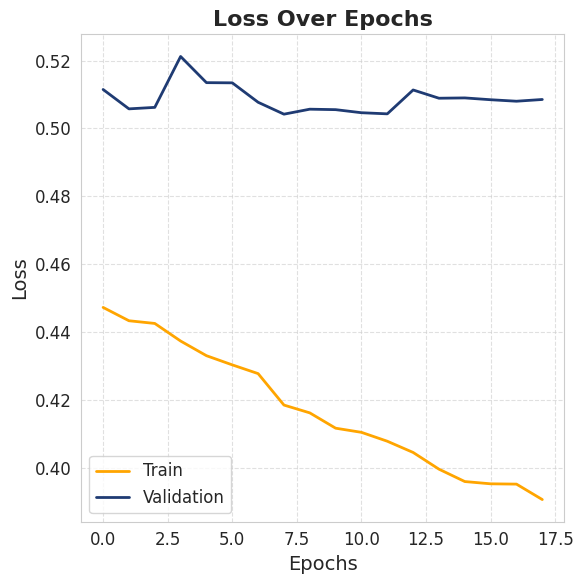

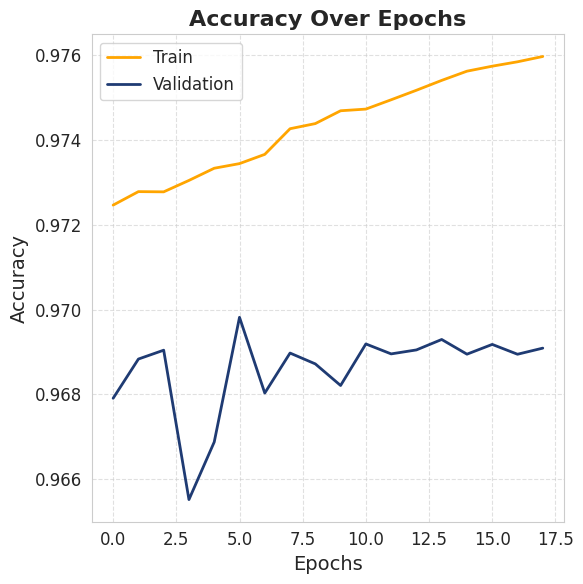

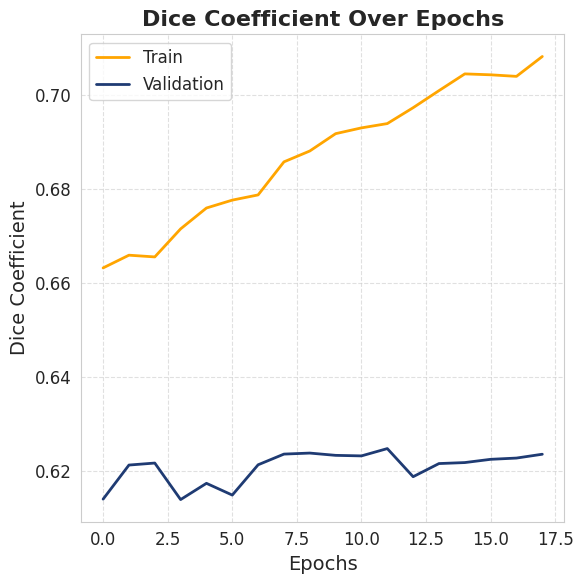

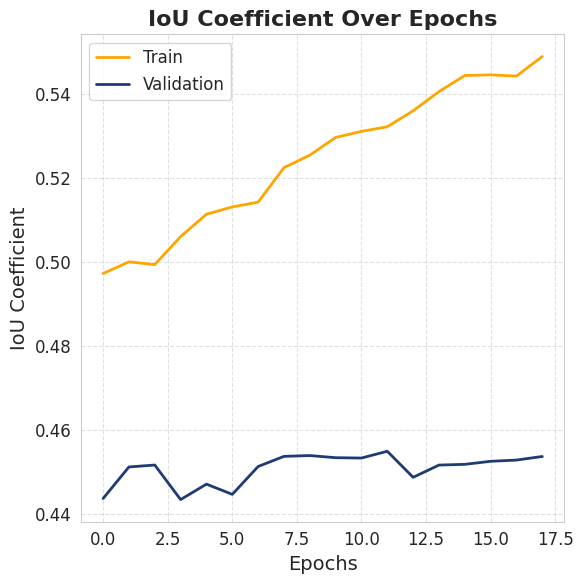

In [19]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, jaccard_score
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Visual Settings
sns.set_style("whitegrid")
plt.rcParams.update({
    "font.size": 12,
    "axes.labelsize": 14,
    "axes.titlesize": 16,
    "legend.fontsize": 12,
    "lines.linewidth": 2,
})

# 🟠 Orange: Train | 🔵 Dark Blue: Validation
def plot_training_metrics_individually(history):
    metrics = ['loss', 'accuracy', 'dice_coef', 'iou_coef']
    titles = ['Loss', 'Accuracy', 'Dice Coefficient', 'IoU Coefficient']
    colors = ['#FFA500', '#1f3b73']  # Orange and Dark Blue

    for i, metric in enumerate(metrics):
        plt.figure(figsize=(6, 6))  # Square box
        plt.plot(history.history[metric], label='Train', color=colors[0])
        plt.plot(history.history[f'val_{metric}'], label='Validation', color=colors[1])
        plt.title(f"{titles[i]} Over Epochs", fontsize=16, fontweight='bold')
        plt.xlabel("Epochs")
        plt.ylabel(titles[i])
        plt.legend(loc='best')
        plt.grid(True, linestyle='--', alpha=0.6)
        plt.tight_layout()
        plt.show()

# Run it
plot_training_metrics_individually(history)





6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 466ms/step


<ipython-input-20-6524d6ab92df>:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["Accuracy", "Precision", "Recall", "F1 Score", "IoU", "Dice"],


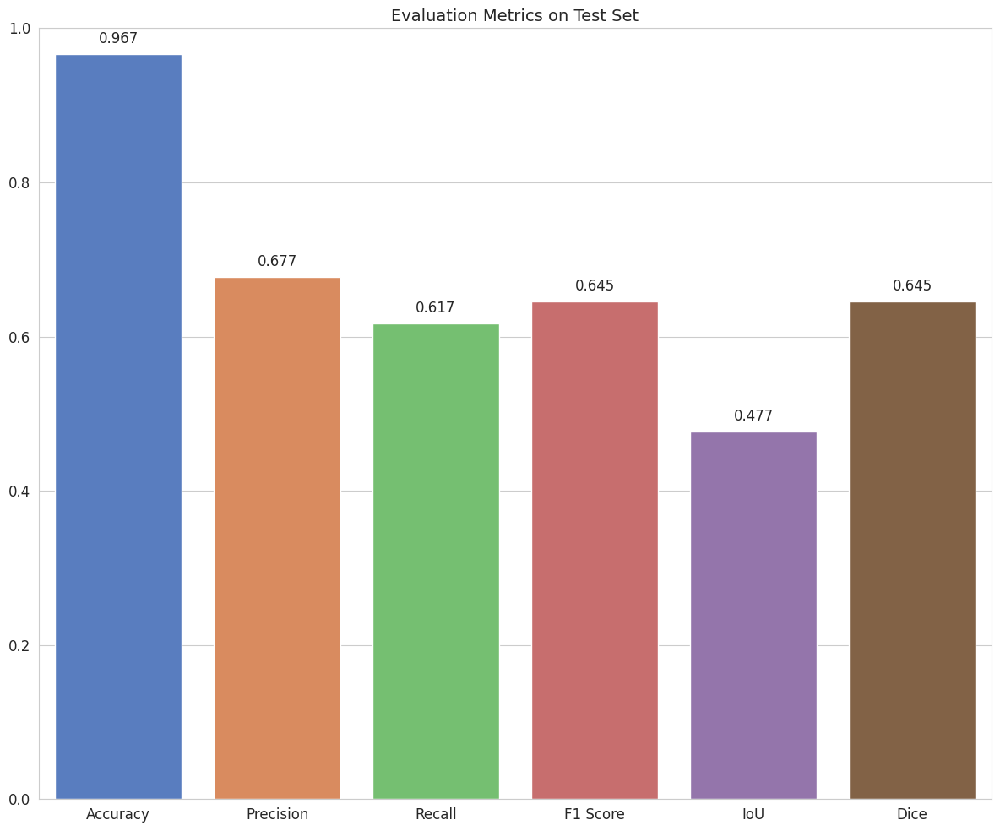

In [20]:
# 🟩 Cell 9: Evaluate on Test Set

# Predict on test set
preds = model.predict(X_test)
# Reshape to (-1, 256*256) to match the actual mask size
preds_bin = (preds > 0.5).astype(np.uint8).reshape(-1, 256*256)
y_true_flat = y_test.reshape(-1, 256*256)

# Flatten for sklearn metrics
flat_pred = preds_bin.flatten()
flat_true = y_true_flat.flatten()

# 🧮 Metrics
acc  = accuracy_score(flat_true, flat_pred)
prec = precision_score(flat_true, flat_pred)
rec  = recall_score(flat_true, flat_pred)
f1   = f1_score(flat_true, flat_pred)
iou  = jaccard_score(flat_true, flat_pred)
dice = (2 * prec * rec) / (prec + rec)

# 📊 Plot as Bar Chart
plt.figure(figsize=(12, 10))
sns.barplot(x=["Accuracy", "Precision", "Recall", "F1 Score", "IoU", "Dice"],
            y=[acc, prec, rec, f1, iou, dice],
            palette="muted")
plt.ylim(0, 1)
plt.title("Evaluation Metrics on Test Set", fontsize=14)
for i, val in enumerate([acc, prec, rec, f1, iou, dice]):
    plt.text(i, val + 0.01, f"{val:.3f}", ha='center', va='bottom', fontsize=12)
plt.tight_layout()
plt.show()

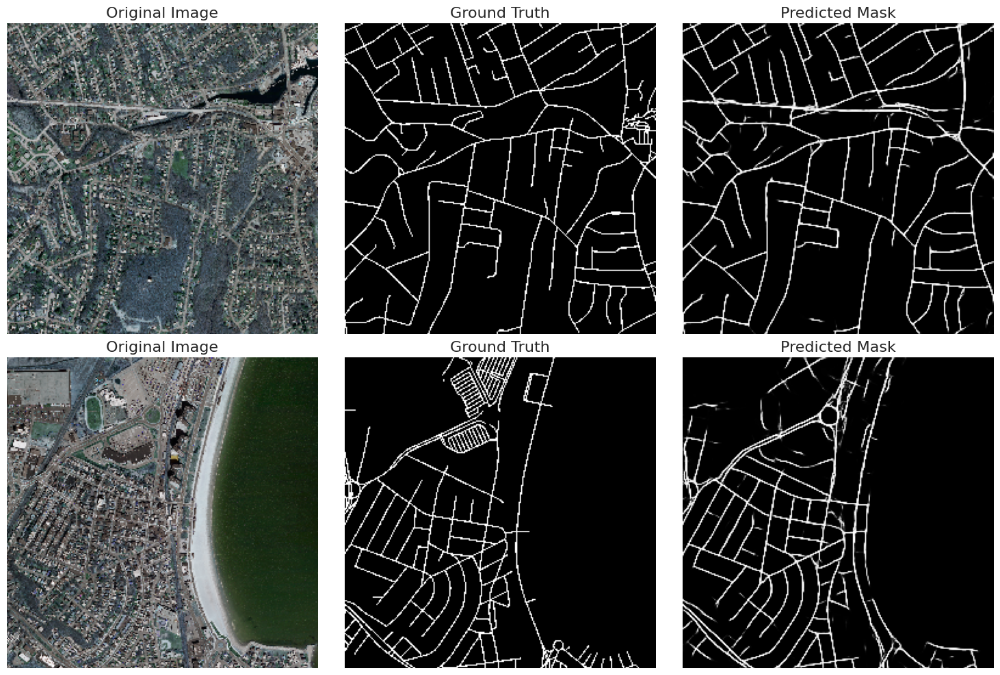

In [23]:
# 🟩 Cell 10: Show Predicted vs Ground Truth Overlay

import matplotlib.pyplot as plt

def show_predictions(X, y_true, y_pred, num=2):
    plt.figure(figsize=(15, num * 5))

    for i in range(num):
        # Original image
        plt.subplot(num, 3, i * 3 + 1)
        plt.imshow(X[i])
        plt.title("Original Image")
        plt.axis("off")

        # Ground Truth (B/W)
        plt.subplot(num, 3, i * 3 + 2)
        plt.imshow(y_true[i].squeeze(), cmap='gray')
        plt.title("Ground Truth")
        plt.axis("off")

        # Predicted Mask (B/W)
        plt.subplot(num, 3, i * 3 + 3)
        plt.imshow(y_pred[i].squeeze(), cmap='gray')
        plt.title("Predicted Mask")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

# Example call (assuming X_test, y_test, preds are numpy arrays)
show_predictions(X_test, y_test, preds, num=2)



25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step


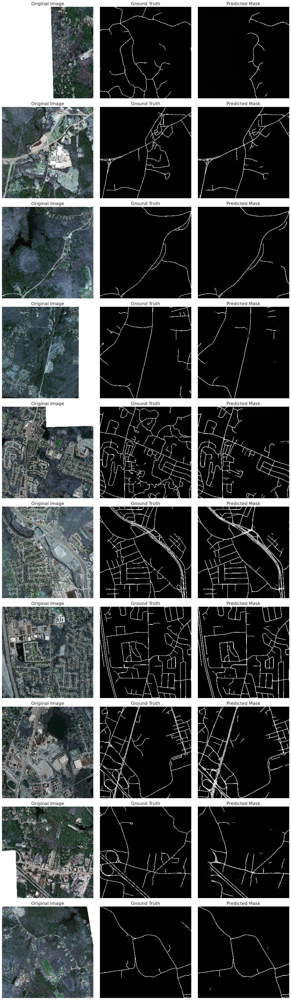

In [28]:
## on training dataset
show_predictions(X_train, y_train, model.predict(X_train), num=10)

6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 292ms/step


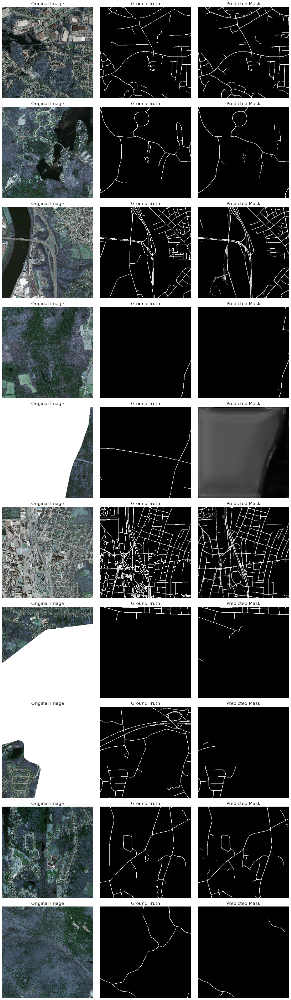

In [25]:
# For validation set
show_predictions(X_val, y_val, model.predict(X_val), num=10)

In [27]:
model.save("road_segmentation_model.h5")


